# ***Meta Data***
- manufacturer - name of the car manufacturer
- model - name of the car model
- year - the year when the car was produced
- mileage - the number of miles the car has traveled since production
- engine - car engine
- transmission - type of the car's transmission
- drivetrain - type of the car's drivetrain
- fuel_type - type of fuel that the car consumes
- mpg - the number of miles a car can travel using one gallon of fuel (miles per gallon)
- exterior_color - car exterior color
- interior_color - car interior color
- accidents_or_damage - whether the car was involved in accidents
- one_owner - whether the car was owned by one person
- personal_use_only - whether the car was used only for personal purposes
- seller_name - name of the seller
- seller_rating - seller's rating
- driver_rating - car rating given by drivers
- driver_reviews_num - the number of car reviews left by drivers
- price_drop - price reduction from the initial price
- price - car price

In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from   datasist.structdata import detect_outliers as do

In [2]:
df= pd.read_csv('new_data_cars.csv')

In [3]:
df.head()

,manufacturer,model,year,mileage,engine,transmission,drivetrain,fuel_type,mpg,exterior_color,interior_color,accidents_or_damage,one_owner,personal_use_only,seller_rating,driver_rating,driver_reviews_num,price,age
0,Acura,Ilx Hybrid 1.5L,2013,53422.0,1.5L I4 8V Mpfi Sohc Hybrid,Automatic CVT,Front-wheel Drive,Hybrid,38.5,Bellanova White Pearl,Ebony,0.0,1.0,1.0,4.3,4.4,12.0,17000.0,10
1,Acura,Ilx Hybrid 1.5L,2013,62042.0,1.5L I4 8V Mpfi Sohc Hybrid,Automatic CVT,Front-wheel Drive,Hybrid,38.5,Polished Metal Metallic,Ebony,0.0,0.0,1.0,2.2,4.4,12.0,18000.0,10
2,Acura,Ilx Hybrid 1.5L,2013,57212.0,1.5L I4 8V Mpfi Sohc Hybrid,Automatic CVT,Front-wheel Drive,Hybrid,38.5,Silver,Ebony,0.0,1.0,1.0,2.2,4.4,12.0,15999.0,10
3,Acura,Zdx Base,2012,148302.0,3.7L V6 24V Mpfi Sohc,6-Speed Automatic,All-wheel Drive,Gasoline,19.5,Other,Taupe,1.0,0.0,1.0,5.0,4.7,4.0,14491.0,11
4,Acura,Zdx Base,2012,110300.0,3.7L V6 24V Mpfi Sohc,6-Speed Automatic,All-wheel Drive,Gasoline,19.5,Black,Tan,0.0,0.0,1.0,1.8,4.7,4.0,15995.0,11


## How many model for each manufacturer

In [13]:
model_number= df.groupby('manufacturer')['model'].nunique().to_frame().reset_index().sort_values(by='model',ascending=False)

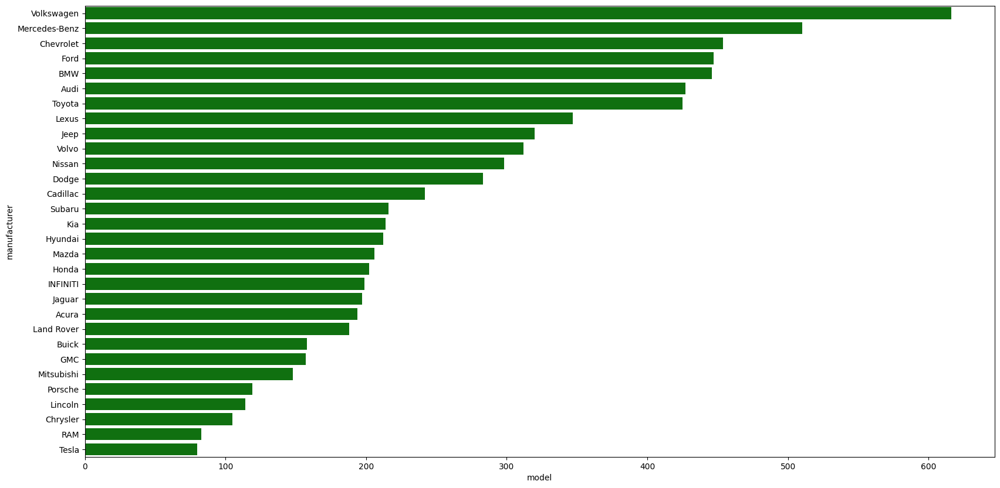

In [46]:
plt.figure(figsize=(20,10))
sns.barplot(model_number,x='model',y='manufacturer',color='green')
plt.show()

## what is the avg price for each manufacturer

<Axes: xlabel='price', ylabel='manufacturer'>

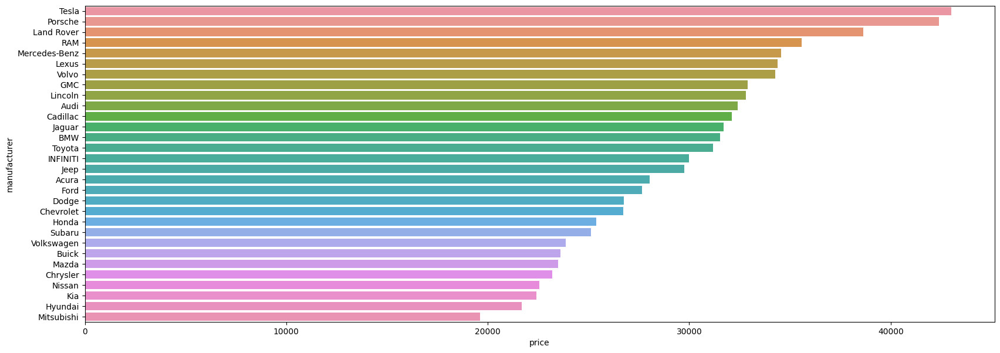

In [16]:
fig= plt.figure(figsize=(20,7))
pric= df.groupby('manufacturer')['price'].mean().round(2).sort_values(ascending=False).reset_index()
sns.barplot(pric,y='manufacturer',x='price')

## How many transimission in each manufacturer

In [17]:
trans_number= df.groupby('manufacturer')['transmission'].nunique().to_frame().reset_index().sort_values(by='transmission',ascending=False)


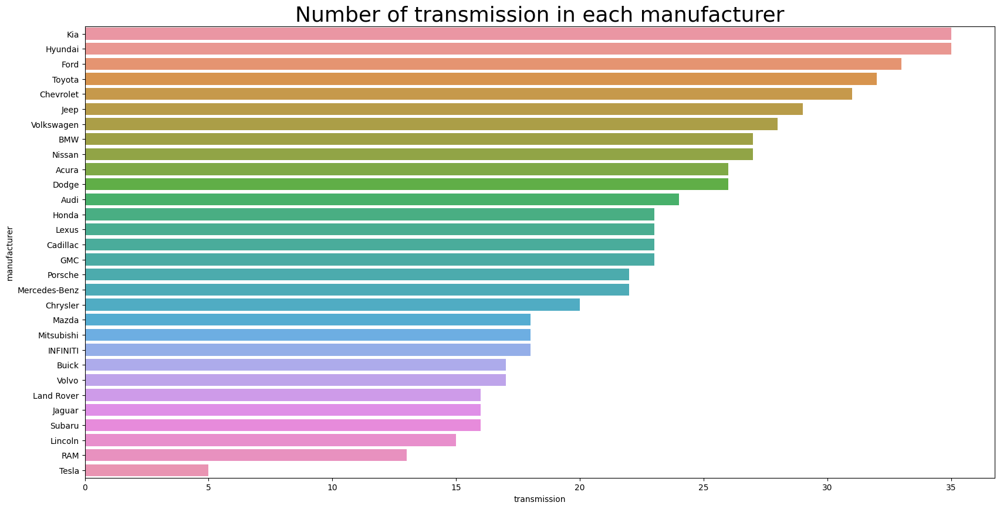

In [18]:
trans_number= df.groupby('manufacturer')['transmission'].nunique().to_frame().reset_index().sort_values(by='transmission',ascending=False)

plt.figure(figsize=(20,10))
sns.barplot(trans_number,x='transmission',y='manufacturer')
plt.title('Number of transmission in each manufacturer',fontsize=26)
plt.show()

## what is the avg price for eahc drivetrain

In [19]:
avg_price_drivetrain = df.groupby('drivetrain')['price'].mean().round(2).to_frame().reset_index().sort_values(by='price',ascending=False)
avg_price_drivetrain

,drivetrain,price
3,Four-wheel Drive,34862.01
1,All-Wheel Drive with Locking Differential,32995.00
4,Front-Wheel Drive with Limited-Slip Differential,32367.75
0,4x2,31442.50
6,Rear-wheel Drive,30767.49
2,All-wheel Drive,30686.33
5,Front-wheel Drive,21546.39


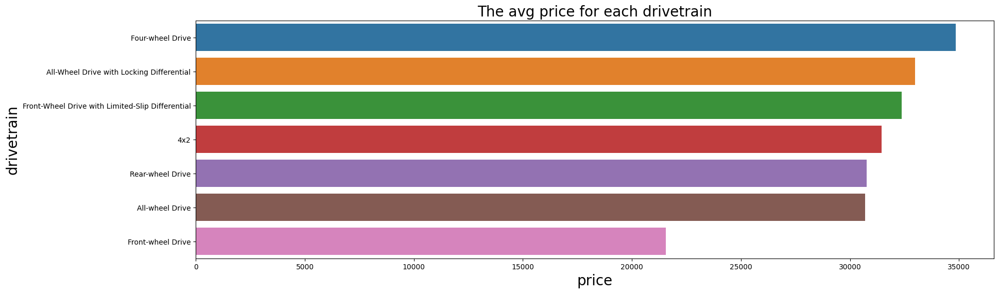

In [20]:
plt.figure(figsize=(20,6))
plt.title('The avg price for each drivetrain',fontsize=20)
sns.barplot(avg_price_drivetrain,x='price',y='drivetrain')
plt.ylabel('drivetrain',fontsize=20)
plt.xlabel('price',fontsize=20)
plt.show()

- so as we see the cars have drivetrian four_wheel_Drive is the most expensive than any other type 
- the cars have front wheel Drive are cheepest type of our type of drivetrain
- any other type are close in the price

## What is the relation between the mileage and price 

<Axes: >

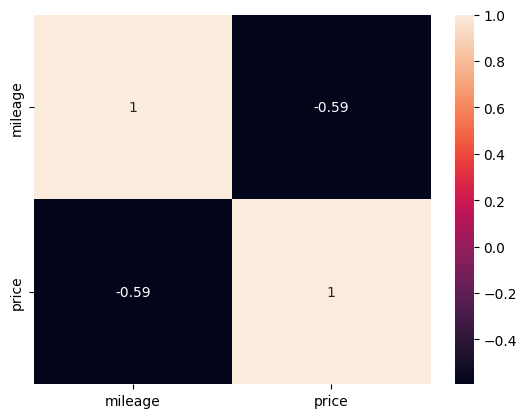

In [21]:
sns.heatmap(df[['mileage','price']].corr(),annot=True)

- the relation between milage and price is negative 

In [22]:
df['drivetrain'].nunique()

7

## what is the most types of drivetrain in each manufacturer

In [23]:

# px.histogram(df,y='manufacturer',color='drivetrain',x='price',barmode='group',height=900)

df_sorted = df.sort_values('price', ascending=False)

# Create the histogram with sorted data and horizontal orientation
fig = px.histogram(df_sorted, y='manufacturer', color='drivetrain', orientation='h', x='price', barmode='group', histfunc='avg', height=1300)

# Display the chart
fig.show()

- the cars that has four wheels and all wheels drive the four wheels driv has the highest price
- the cars that doesn't have four wheels drivetrain the all wheels drive train has the highest price 

## what is the avg price in each manufacturer if it's the car made accidant or no 

In [24]:
df_avg = df.groupby(['manufacturer', 'accidents_or_damage'])['price'].mean().reset_index()

# Sort the DataFrame by average price in descending order
df_sorted = df_avg.sort_values('price', ascending=False)

# Plot the histogram with the sorted DataFrame
fig = px.histogram(df_sorted, x='accidents_or_damage', color='manufacturer', y='price', histfunc='avg', barmode='group')

# Rearrange the bars based on the sorted DataFrame
fig.update_layout(
    xaxis={'categoryorder': 'array', 'categoryarray': df_sorted['manufacturer'].unique()}
)

fig.show()

- the lowest price for the less three manufacturers is  mitsubishi and Hundai and Kia when the accidant is 1 
- the highest price for the hieghest three manufacturer is Tesla and Porsche and Land Rover


# what is the most three popular transmission and there price 

In [25]:
df['transmission'].value_counts().nlargest(3)

8-Speed Automatic    114801
6-Speed Automatic    110567
Automatic CVT         84959
Name: transmission, dtype: int64

In [26]:
most_three_transmission = df[df['transmission'].isin(['Automatic CVT', '6-Speed Automatic', '8-Speed Automatic'])]

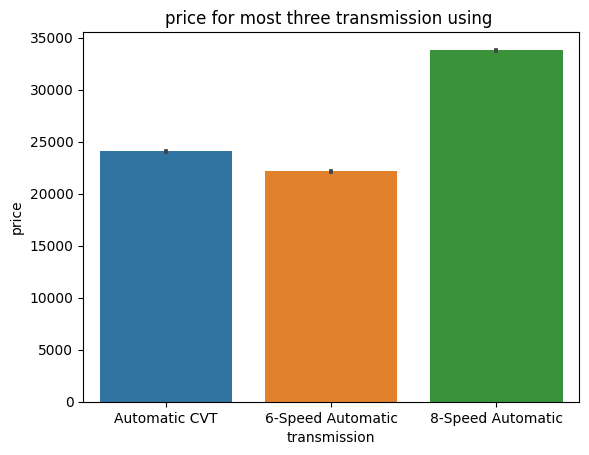

In [27]:
sns.barplot(most_three_transmission,x='transmission',y='price')
plt.title('price for most three transmission using ');

- 8-seed automatic has the heigest price 
- automatic cvt  and 6-speed automatic are close to each other in the price

## what is the most fuel_type using and what is the price for each kind 

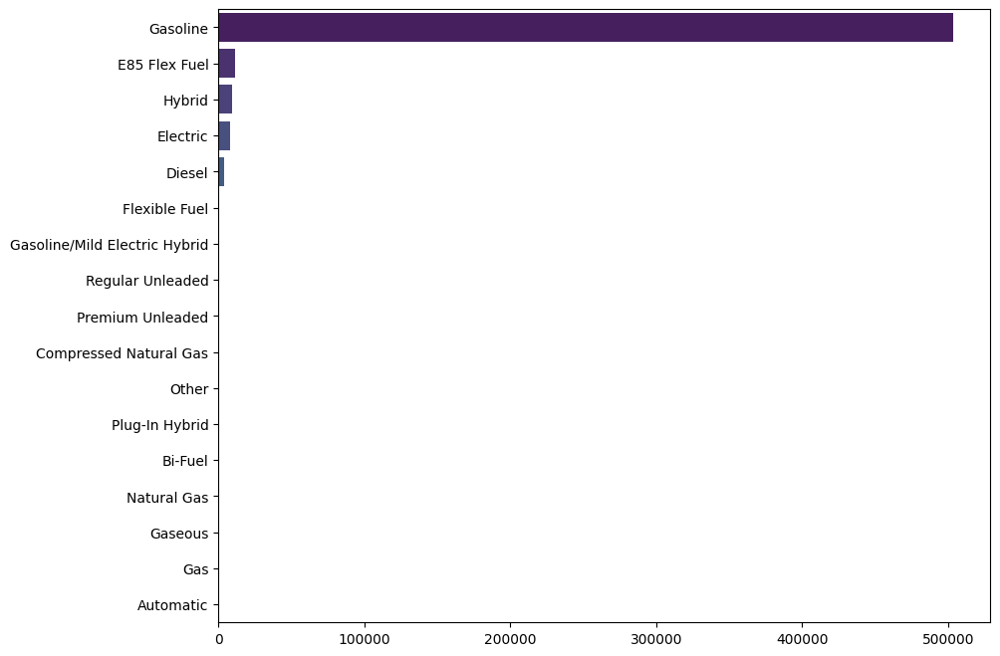

In [28]:
fuel=df['fuel_type'].value_counts()
plt.figure(figsize=(10,8))
sns.barplot(df,y=fuel.index,x=fuel.values,palette='viridis')
plt.show()

- the popular type of fuel is Gasoline

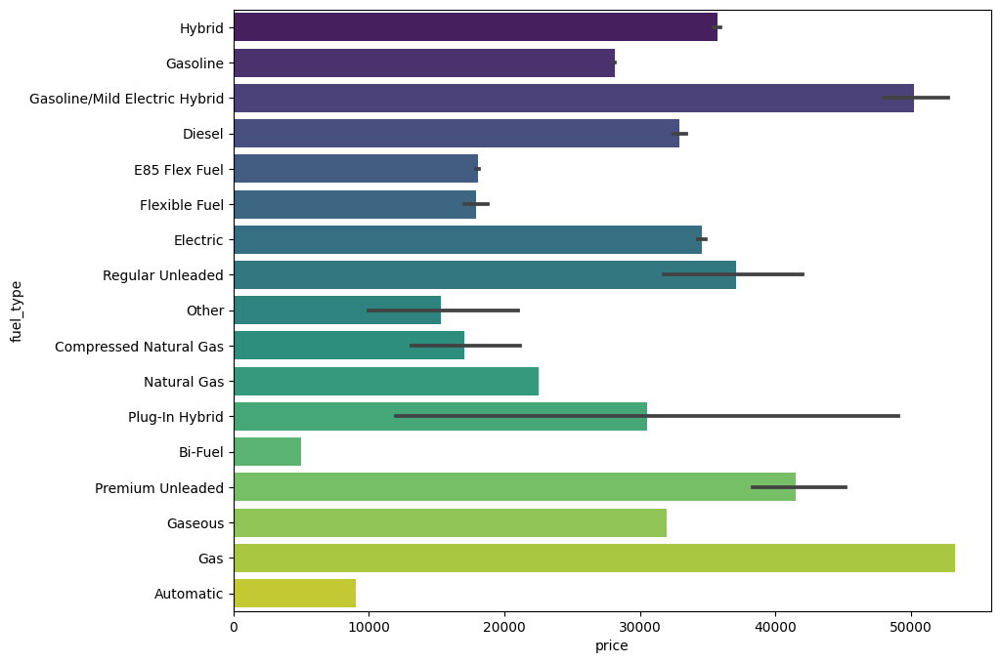

In [29]:
plt.figure(figsize=(10,8))
sns.barplot(df,y='fuel_type',x='price',palette='viridis')
plt.show()

- Gas and Mild Electric Hypred fuel are  the heighest price 
- but Gasoline has the middel price 

## what is the price in each type of one owner

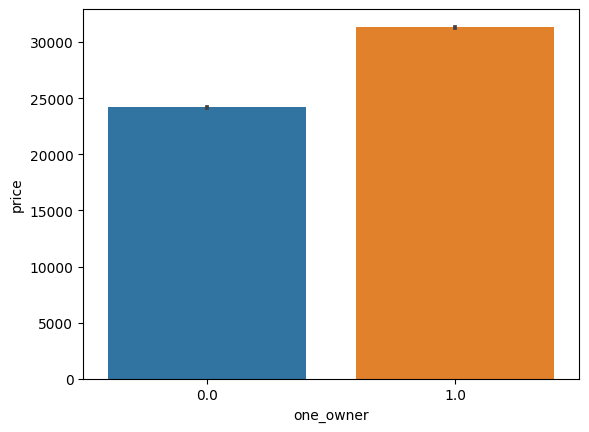

In [30]:
sns.barplot(df,x='one_owner',y='price')
plt.show()

- the car with one owner has biggest price 
- the cars with no owner has the lowest price

## what is the avg price for cars that use electric fuel 

<Axes: xlabel='price'>

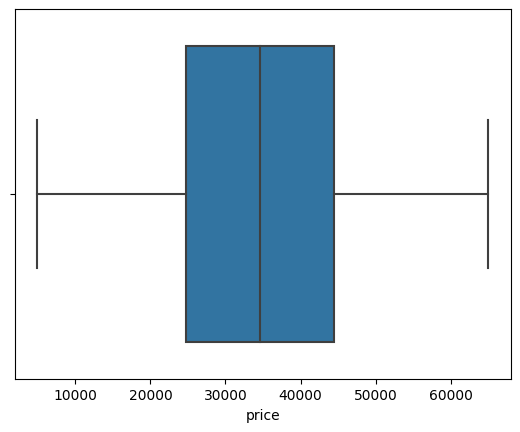

In [45]:
electric = df[df['fuel_type']=='Electric']['price']
sns.boxplot(x=electric)

- the avg price for the electric cars is 34,585k

## what is the avg price for cars use Gasoline 

<Axes: xlabel='price'>

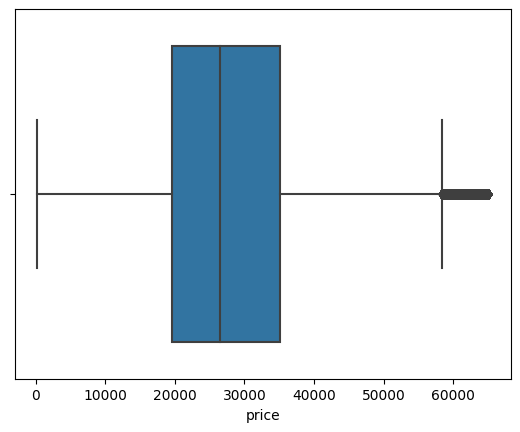

In [44]:
gasoline = df[df['fuel_type']=='Gasoline']['price']
sns.boxplot(x=gasoline)

- the avg price for cars uses Gasoline Fuel is 26,495k

## What is the relation between price and age 

<Axes: xlabel='age', ylabel='price'>

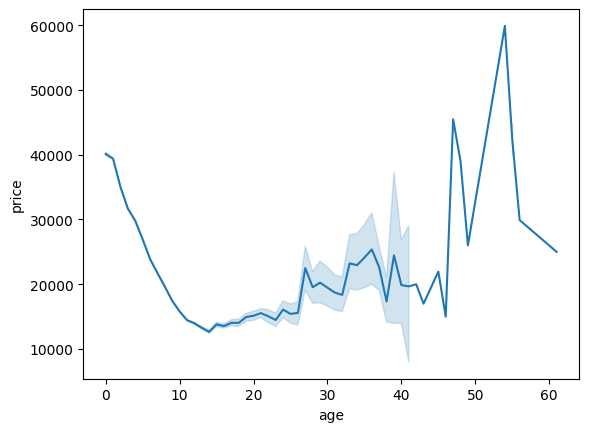

In [33]:
sns.lineplot(df,x='age',y='price')

<Axes: >

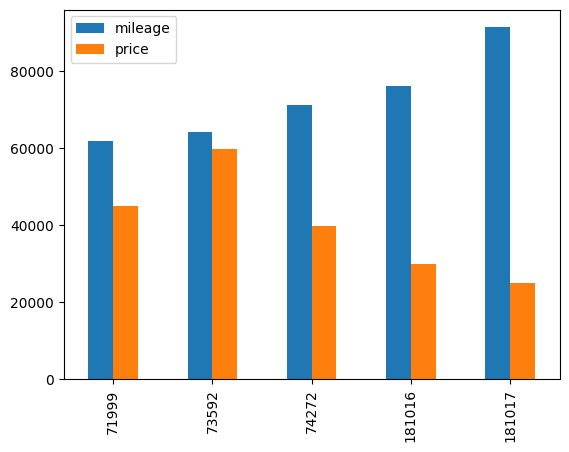

In [34]:
df[df['age']>=50][['mileage','price']].plot(kind='bar')

## what is the manufacturers predusing electry cars and wich one is the most 

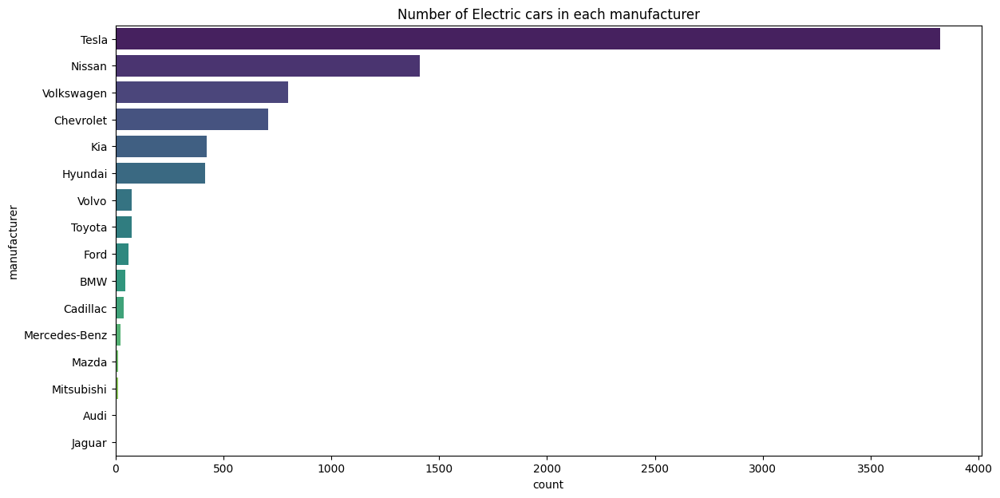

In [35]:
electric_cars= df[df['fuel_type']=='Electric']
plt.figure(figsize=(14,7))
sns.countplot(electric_cars ,y='manufacturer',order=(electric_cars['manufacturer'].value_counts()).index,palette='viridis')
plt.title('Number of Electric cars in each manufacturer')
plt.show()

- the most popular manufcaturer producing the electric cars is Tesla then Nissan then Volskwagen then Chevrolet then Kia and Hyundai

## what is the relation between numeric columns and price 

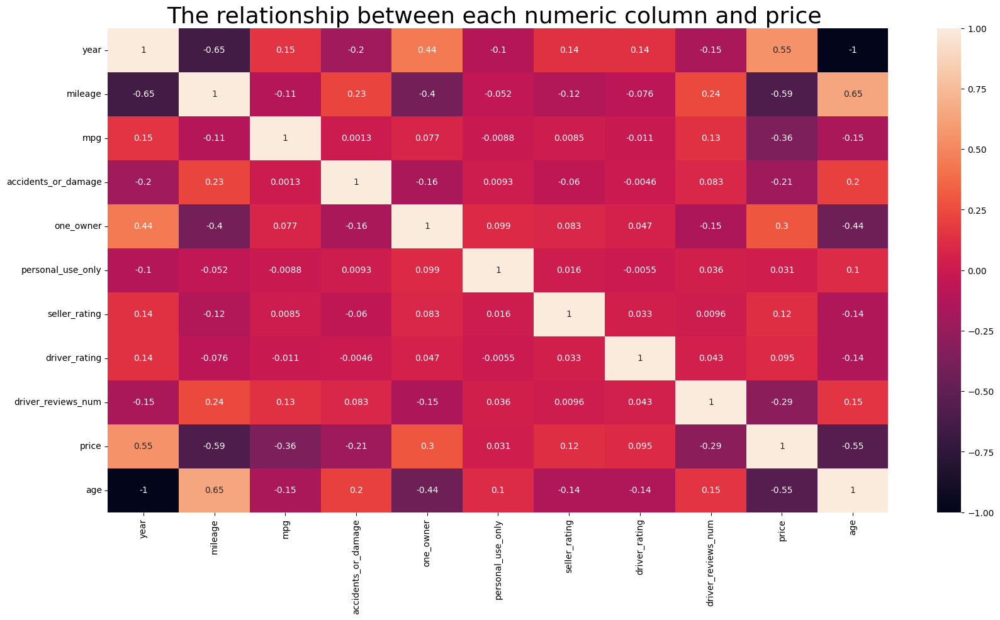

In [36]:
plt.figure(figsize=(20,10))
sns.heatmap(df.select_dtypes('number').corr(),annot=True)
plt.title('The relationship between each numeric column and price ',fontsize=26)
plt.show()

- the relation between price and mileage is negative and equal = -59
- the relation between price and age is negative and equal = -55
- the relation between mileage and age is positive and equal = 65

<Axes: xlabel='personal_use_only', ylabel='price'>

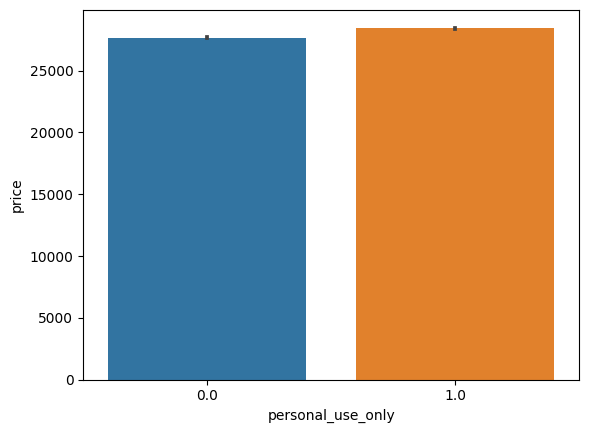

In [37]:
sns.barplot(df,x='personal_use_only',y='price')

- there is no a big difference between the price of using personal only and not personal use only

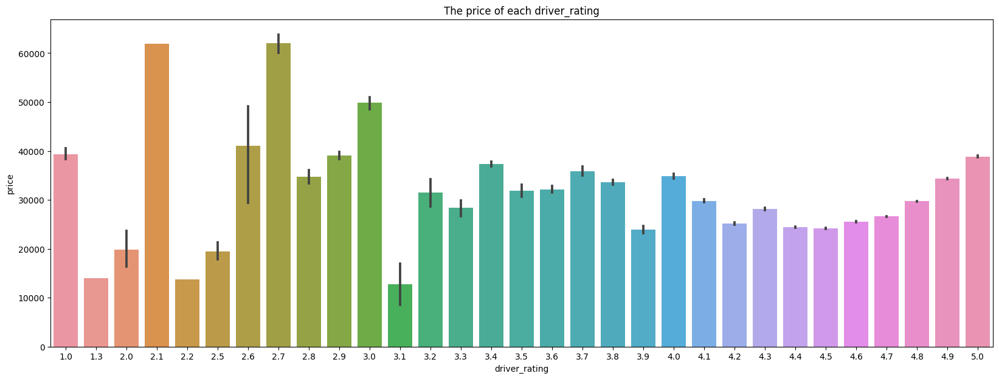

In [38]:
plt.figure(figsize=(20,7))
sns.barplot(df,x='driver_rating',y='price')
plt.title('The price of each driver_rating')
plt.show()

- so the driver_rating  doesn't effect on the price 

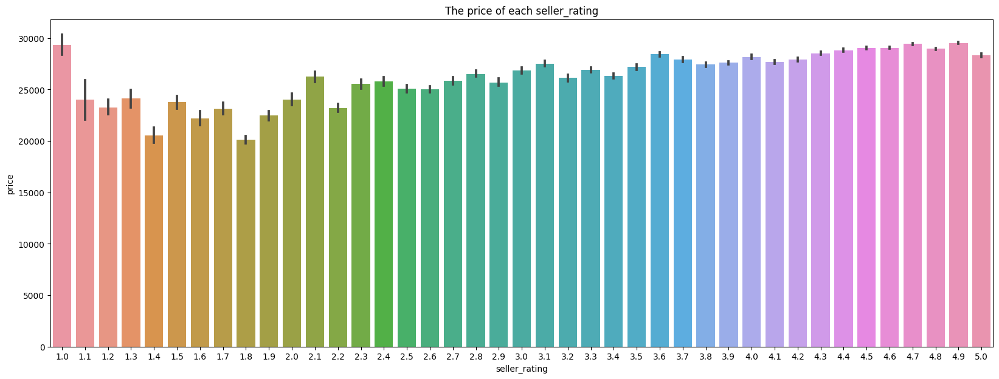

In [39]:
plt.figure(figsize=(20,7))
sns.barplot(df,x='seller_rating',y='price')
plt.title('The price of each seller_rating')
plt.show()

- there is no a big effect on the price  from seller rating if he has high rating or not 

In [5]:
df['price'].max()

65041.0